In [1]:
import os
import random
import shutil
from tqdm import tqdm
from glob import glob

import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as patches

import cv2
from PIL import Image
import imgaug.augmenters as iaa
from imgaug.augmentables.bbs import BoundingBox, BoundingBoxesOnImage

%matplotlib inline

In [2]:
MAKEUP_LABELS_MAP_8 = {
    0: 'bold_makeup', 
    1: 'bold_smokey_eye_makeup', 
    2: 'casual_makeup', 
    3: 'evening_glamour_makeup', 
    4: 'evening_makeup', 
    5: 'fantasy_makeup', 
    6: 'no_makeup', 
    7: 'vintage_makeup'
}

MAKEUP_LABELS_MAP_6 = {
    0: 'bold_makeup', # bold & bold smokey eye & vintage
    2: 'casual_makeup', 
    3: 'evening_glamour_makeup', 
    4: 'evening_makeup', 
    5: 'fantasy_makeup', 
    6: 'no_makeup',
}

MAKEUP_LABELS_8 = [
    'bold_makeup', 
    'bold_smokey_eye_makeup',
    'casual_makeup', 
    'evening_glamour_makeup', 
    'evening_makeup', 
    'fantasy_makeup', 
    'no_makeup', 
    'vintage_makeup'
]

MAKEUP_LABELS_6 = [
    'bold_makeup', 
    'casual_makeup', 
    'evening_glamour_makeup', 
    'evening_makeup', 
    'fantasy_makeup', 
    'no_makeup', 
]

ALL_DATA_PATH = "datasets/raw/all"
RAW_DATA_PATH = "datasets/raw"

## DATA ANALYSIS

**RAW DATA**

In [3]:
data_raw = {}

for makeup in MAKEUP_LABELS_6:
    data_raw[makeup] = []

    for images in tqdm(glob(f"{RAW_DATA_PATH}/{makeup}/images/*.jpg")):
        data_raw[makeup].append(images)

100%|██████████| 581/581 [00:00<?, ?it/s]


In [4]:
data_raw_df = pd.DataFrame.from_dict(data_raw, orient='index').T
data_raw_df.head()

,bold_makeup,casual_makeup,evening_glamour_makeup,evening_makeup,fantasy_makeup,no_makeup
0,datasets/raw/bold_makeup/images\bold(1).jpg,datasets/raw/casual_makeup/images\casual(1).jpg,datasets/raw/evening_glamour_makeup/images\eve...,datasets/raw/evening_makeup/images\evening(1).jpg,datasets/raw/fantasy_makeup/images\fantasy(1).jpg,datasets/raw/no_makeup/images\no_makeup(1).jpg
1,datasets/raw/bold_makeup/images\bold(10).jpg,datasets/raw/casual_makeup/images\casual(10).jpg,datasets/raw/evening_glamour_makeup/images\eve...,datasets/raw/evening_makeup/images\evening(10)...,datasets/raw/fantasy_makeup/images\fantasy(10)...,datasets/raw/no_makeup/images\no_makeup(10).jpg
2,datasets/raw/bold_makeup/images\bold(100).jpg,datasets/raw/casual_makeup/images\casual(100).jpg,datasets/raw/evening_glamour_makeup/images\eve...,datasets/raw/evening_makeup/images\evening(100...,datasets/raw/fantasy_makeup/images\fantasy(100...,datasets/raw/no_makeup/images\no_makeup(100).jpg
3,datasets/raw/bold_makeup/images\bold(101).jpg,datasets/raw/casual_makeup/images\casual(101).jpg,datasets/raw/evening_glamour_makeup/images\eve...,datasets/raw/evening_makeup/images\evening(101...,datasets/raw/fantasy_makeup/images\fantasy(101...,datasets/raw/no_makeup/images\no_makeup(101).jpg
4,datasets/raw/bold_makeup/images\bold(102).jpg,datasets/raw/casual_makeup/images\casual(102).jpg,datasets/raw/evening_glamour_makeup/images\eve...,datasets/raw/evening_makeup/images\evening(102...,datasets/raw/fantasy_makeup/images\fantasy(102...,datasets/raw/no_makeup/images\no_makeup(102).jpg


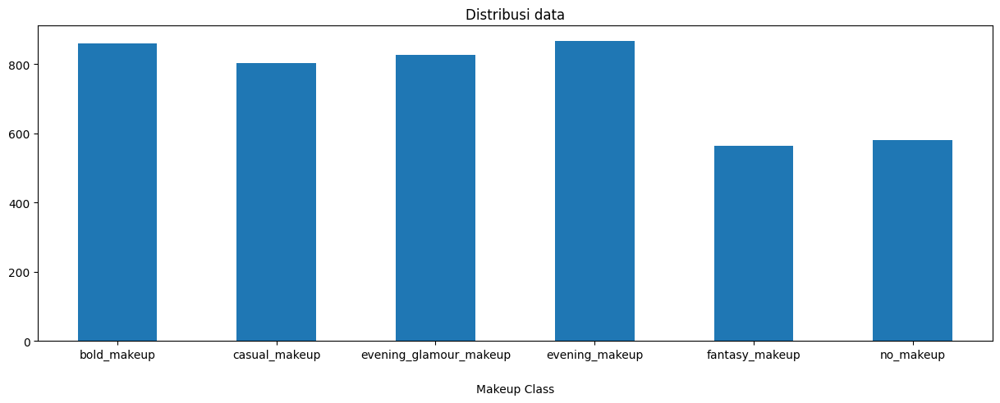

In [5]:
data_raw_df.count().plot(kind='bar', figsize=(15, 5))

plt.title("Distribusi Data")

plt.xlabel("Makeup Class", labelpad=20)
plt.xticks(rotation=0)

plt.show()

**ALL DATA**

In [18]:
data_all = {
    'bold_makeup': [],
    'bold_smokey_eye_makeup': [],
    'casual_makeup': [],
    'evening_glamour_makeup': [],
    'evening_makeup': [],
    'fantasy_makeup': [],
    'no_makeup': [],
    'vintage_makeup': []
}

for labels in tqdm(glob(f"{ALL_DATA_PATH}/labels/*.txt")):
    file = open(labels).read()
    
    for label in file.split("\n"):
        if not label == "":
            category = MAKEUP_LABELS_8[int(label.split(" ")[0])]
            data_all[category].append(labels)

100%|██████████| 13572/13572 [00:00<00:00, 34346.04it/s]


In [19]:
data_all_df = pd.DataFrame.from_dict(data_all, orient='index').T
data_all_df.head()

,bold_makeup,bold_smokey_eye_makeup,casual_makeup,evening_glamour_makeup,evening_makeup,fantasy_makeup,no_makeup,vintage_makeup
0,datasets/raw/all/labels\-1_11-Asian-wedding-ma...,datasets/raw/all/labels\-1_-0jX5TIk_hUrBBdsZEv...,datasets/raw/all/labels\-1_002-bridal-makeup-f...,datasets/raw/all/labels\-1_150429-steampunk-gi...,datasets/raw/all/labels\-1_086a5a4034ece6b3e9e...,datasets/raw/all/labels\-1_140622-asian-makeup...,datasets/raw/all/labels\00000-1221197924_png_j...,datasets/raw/all/labels\-1_266986623_132247147...
1,datasets/raw/all/labels\-1_16668191_fpx_jpeg_j...,datasets/raw/all/labels\-1_1-day-makeup-course...,datasets/raw/all/labels\-1_003bc-1-scaled_jpeg...,datasets/raw/all/labels\-1_169305108_189734810...,datasets/raw/all/labels\-1_145313-Arpita-Steve...,datasets/raw/all/labels\-1_14254830967_7207d58...,datasets/raw/all/labels\00000-1221197924_png_j...,datasets/raw/all/labels\-1_bridal-beauty-inspi...
2,datasets/raw/all/labels\-1_2022-New-Design-Sof...,datasets/raw/all/labels\-1_1583312411_makeup_v...,datasets/raw/all/labels\-1_052616-victoria-bec...,datasets/raw/all/labels\-1_243dc41d-7192-43f0-...,datasets/raw/all/labels\-1_4a71dda265353667fd6...,datasets/raw/all/labels\-1_3_jpeg_jpg.rf.b1404...,datasets/raw/all/labels\00001-1221197925_png_j...,datasets/raw/all/labels\-1_c5b23a0a0ef4f611ba2...
3,datasets/raw/all/labels\-1_78093db304949d7af82...,datasets/raw/all/labels\-1_16-5c7cff5512bec__7...,datasets/raw/all/labels\-1_10-Natural-wedding-...,datasets/raw/all/labels\-1_350137df-7067-44b5-...,datasets/raw/all/labels\-1_a847a0d1-b230-42fe-...,datasets/raw/all/labels\-1_alternative-shapes-...,datasets/raw/all/labels\00002-1221197926_png_j...,datasets/raw/all/labels\00933f907470d5273a7560...
4,datasets/raw/all/labels\-1_8-Asian-wedding-mak...,datasets/raw/all/labels\-1_1626507049_Screensh...,datasets/raw/all/labels\-1_15b7a0d4-6bcb-11e9-...,datasets/raw/all/labels\-1_5-Asian-wedding-mak...,datasets/raw/all/labels\-1_alt-makeup-trends-m...,datasets/raw/all/labels\-1_asian-american_jpeg...,datasets/raw/all/labels\00002-1221197926_png_j...,datasets/raw/all/labels\00c55f257a98b17b4c094b...


In [20]:
data_all_df.count()

bold_makeup               1888
bold_smokey_eye_makeup    1029
casual_makeup             2316
evening_glamour_makeup    1785
evening_makeup            1942
fantasy_makeup            1886
no_makeup                 1701
vintage_makeup            1288
dtype: int64

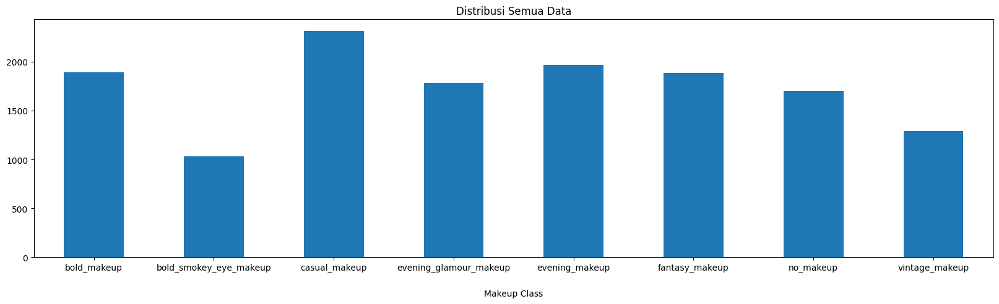

In [6]:
data_all_df.count().plot(kind='bar', figsize=(20, 5))

plt.title("Distribusi Semua Data")

plt.xlabel("Makeup Class", labelpad=20)
plt.xticks(rotation=0)

plt.show()

## Preprocess Data

In [7]:
for makeup in MAKEUP_LABELS_6:
    for images in tqdm(glob(f"{RAW_DATA_PATH}/{makeup}/images/*.jpg")):
        images_name = images.split("\\")[-1]
        shutil.copyfile(images, f"{ALL_DATA_PATH}/images/{images_name}")

    for labels in tqdm(glob(f"{RAW_DATA_PATH}/{makeup}/labels/*.txt")):
        file = open(labels, "r")

        label = file.read()
        label_name = labels.split("\\")[-1]
        
        makeup_key = list(MAKEUP_LABELS_MAP_6.keys())
        makeup_value = list(MAKEUP_LABELS_MAP_6.values())

        category = label.split(" ")
        category[0] = str(makeup_key[makeup_value.index(makeup)])

        file_w = open(labels, "w")
        file_w.write(" ".join(category))
        file_w.close()

        shutil.copyfile(labels, f"{ALL_DATA_PATH}/labels/{label_name}")

100%|██████████| 581/581 [00:02<00:00, 239.33it/s]


## AUGMENTING IMAGE

**DELETING INVALID LABEL**

In [17]:
for label in tqdm(glob(f"{ALL_DATA_PATH}/labels/*.txt")):
    text_name = label.split("\\")[-1]
    images_name = ".".join(text_name.split(".")[:-1])
    
    if not os.path.exists(f"{ALL_DATA_PATH}/images/{images_name + '.jpg'}"):
        os.remove(label)

100%|██████████| 13594/13594 [00:00<00:00, 93015.78it/s]


**AUGMENTATION IMAGE FUNCTION**

In [5]:
def revert_normalize_coordinates(yolo_file_path, image_width, image_height, img_path):
    """
    Revert normailze the coordinates from labels to coordinates based on the image.
    :param yolo_file_path: 
    :param image_width: 
    :param image_height: 
    :param img_path: 
    :return: Not normalized coordinates based on the image.
    """
    with open(yolo_file_path, 'r') as file:
        lines = file.readlines()

    bounding_boxes = []
    for line in lines:
        try:
            class_id, x_center, y_center, width, height = map(float, line.split())
            
            x_min = int((x_center - width / 2) * image_width)
            y_min = int((y_center - height / 2) * image_height)
            x_max = int((x_center + width / 2) * image_width)
            y_max = int((y_center + height / 2) * image_height)
            
            bounding_boxes.append([int(class_id), x_min, y_min, x_max, y_max, img_path])
            
        except ValueError:
            continue
        
    return bounding_boxes[0]

def normalize_coordinates(yolo_file_path, bounding_boxes, class_id, image_width, image_height):
    """
    Normalize the coordinates from image to yolo format
    :param yolo_file_path: 
    :param bounding_boxes: 
    :param class_id: 
    :param image_width: 
    :param image_height: 
    :return: Nothing
    """
    with open(yolo_file_path, 'w') as file:
        x_min, y_min, x_max, y_max = bounding_boxes.x1, bounding_boxes.y1, bounding_boxes.x2, bounding_boxes.y2
        x_center = (x_min + x_max) / (2 * image_width)
        y_center = (y_min + y_max) / (2 * image_height)
        width = (x_max - x_min) / image_width
        height = (y_max - y_min) / image_height
        
        file.write(f"{class_id} {x_center} {y_center} {width} {height}\n")

**CREATE DATAFRAME FOR EASY ACCESS**

In [63]:
datas = []

for data in tqdm(glob(f"{ALL_DATA_PATH}/labels/*.txt")):
    text_name = data.split("\\")[-1]
    image_name = ".".join(text_name.split(".")[:-1])
    image_path = f"{ALL_DATA_PATH}/images/{image_name + '.jpg'}"
    
    image = Image.open(image_path)
    datas.append(revert_normalize_coordinates(data, image_width=image.width, image_height=image.height, img_path=image_path))
    
data_df = pd.DataFrame(datas, columns=['class_id', 'x', 'y', 'w', 'h', 'image_path'])
data_df.head()

100%|██████████| 13572/13572 [00:01<00:00, 11110.39it/s]


,class_id,x,y,w,h,image_path
0,1,72,28,345,253,datasets/raw/all/images/-1_-0jX5TIk_hUrBBdsZEv...
1,2,130,55,360,229,datasets/raw/all/images/-1_002-bridal-makeup-f...
2,2,237,32,469,325,datasets/raw/all/images/-1_003bc-1-scaled_jpeg...
3,2,139,77,342,264,datasets/raw/all/images/-1_052616-victoria-bec...
4,4,129,131,347,395,datasets/raw/all/images/-1_086a5a4034ece6b3e9e...


**AUGMENTING DATA**

In [136]:
seq = iaa.Sequential(
    [
        iaa.GaussianBlur(sigma=(1.0, 2.5)),  # blur
        iaa.LinearContrast((1.0, 1.03)),   # contrast
        iaa.AdditiveGaussianNoise(loc=0, scale=(0.03*255, 0.075*255)),  # noise
        iaa.Multiply((1.0, 1.06)),  # brightness
        iaa.Fliplr(0.8),  
        iaa.ShearX((-10, 10)),
        iaa.ShearY((-10, 10))
    ]
)

In [3]:
AUGMENT_IMAGE_PATH = "datasets/augmented/8/images"
AUGMENT_LABEL_PATH = "datasets/augmented/8/labels"
MAX_CLASS_COUNT = 7000

In [ ]:
grouped_data = data_df.groupby('class_id')

for class_id, group_df in tqdm(grouped_data):
    class_count = len(group_df)
    
    num_remaining_image = MAX_CLASS_COUNT - class_count
    random_image = group_df.sample(n=num_remaining_image, replace=True)
    
    print(f"Copying raw file {class_id}")
    for i, image_data in enumerate(group_df.iterrows()):
        image_path = image_data[1]['image_path']
        
        label_path = image_path.split("/")[-1].replace(".jpg", ".txt")
        label_path = f"{ALL_DATA_PATH}/labels/{label_path}"
        
        image_dest_path = image_path.replace("/raw/all", "/augmented")
        label_dest_path = label_path.replace("/raw/all", "/augmented")

        shutil.copy(image_path, image_dest_path)
        shutil.copy(label_path, label_dest_path)

    print(f"Augmenting image {class_id}")
    for i, random_row in enumerate(random_image.iterrows()):
        image_path = random_row[1]['image_path']
        class_id = random_row[1]['class_id']
        
        image = cv2.imread(image_path)
        
        bbox = BoundingBox(
                x1=float(random_row[1]['x']),
                y1=float(random_row[1]['y']),
                x2=float(random_row[1]['w']),
                y2=float(random_row[1]['h'])
            )
        bbs = [BoundingBoxesOnImage([bbox], shape=image.shape)]
        
        augmented_image, label_agumented = seq(image=image, bounding_boxes=bbs)
        augmented_bbox = label_agumented[0].bounding_boxes[0]
        
        cv2.imwrite(f"{AUGMENT_IMAGE_PATH}/augmented_image_{class_id}_{i}.jpg", augmented_image)
        
        normalize_coordinates(
            yolo_file_path=f"{AUGMENT_LABEL_PATH}/augmented_image_{class_id}_{i}.txt",
            bounding_boxes=augmented_bbox,
            class_id=class_id,
            image_height=image.shape[0],
            image_width=image.shape[1]
        )

**PLOTTING RESULT**

In [151]:
data_augmented_all = {
    'bold_makeup': [],
    'bold_smokey_eye_makeup': [],
    'casual_makeup': [],
    'evening_glamour_makeup': [],
    'evening_makeup': [],
    'fantasy_makeup': [],
    'no_makeup': [],
    'vintage_makeup': []
}

for labels in tqdm(glob(f"{AUGMENT_LABEL_PATH}/*.txt")):
    file = open(labels).read()
    
    for label in file.split("\n"):
        if not label == "":
            category = MAKEUP_LABELS_8[int(label.split(" ")[0])]
            data_augmented_all[category].append(labels)

100%|██████████| 56000/56000 [00:01<00:00, 33714.64it/s]


In [152]:
data_augmented_all_df = pd.DataFrame.from_dict(data_augmented_all, orient='index').T
data_augmented_all_df.head()

,bold_makeup,bold_smokey_eye_makeup,casual_makeup,evening_glamour_makeup,evening_makeup,fantasy_makeup,no_makeup,vintage_makeup
0,datasets/augmented/labels\-1_11-Asian-wedding-...,datasets/augmented/labels\-1_-0jX5TIk_hUrBBdsZ...,datasets/augmented/labels\-1_002-bridal-makeup...,datasets/augmented/labels\-1_150429-steampunk-...,datasets/augmented/labels\-1_086a5a4034ece6b3e...,datasets/augmented/labels\-1_140622-asian-make...,datasets/augmented/labels\00000-1221197924_png...,datasets/augmented/labels\-1_266986623_1322471...
1,datasets/augmented/labels\-1_16668191_fpx_jpeg...,datasets/augmented/labels\-1_1-day-makeup-cour...,datasets/augmented/labels\-1_003bc-1-scaled_jp...,datasets/augmented/labels\-1_169305108_1897348...,datasets/augmented/labels\-1_145313-Arpita-Ste...,datasets/augmented/labels\-1_14254830967_7207d...,datasets/augmented/labels\00000-1221197924_png...,datasets/augmented/labels\-1_bridal-beauty-ins...
2,datasets/augmented/labels\-1_2022-New-Design-S...,datasets/augmented/labels\-1_1583312411_makeup...,datasets/augmented/labels\-1_052616-victoria-b...,datasets/augmented/labels\-1_243dc41d-7192-43f...,datasets/augmented/labels\-1_4a71dda265353667f...,datasets/augmented/labels\-1_3_jpeg_jpg.rf.b14...,datasets/augmented/labels\00001-1221197925_png...,datasets/augmented/labels\-1_c5b23a0a0ef4f611b...
3,datasets/augmented/labels\-1_78093db304949d7af...,datasets/augmented/labels\-1_16-5c7cff5512bec_...,datasets/augmented/labels\-1_10-Natural-weddin...,datasets/augmented/labels\-1_350137df-7067-44b...,datasets/augmented/labels\-1_a847a0d1-b230-42f...,datasets/augmented/labels\-1_alternative-shape...,datasets/augmented/labels\00002-1221197926_png...,datasets/augmented/labels\00933f907470d5273a75...
4,datasets/augmented/labels\-1_8-Asian-wedding-m...,datasets/augmented/labels\-1_1626507049_Screen...,datasets/augmented/labels\-1_15b7a0d4-6bcb-11e...,datasets/augmented/labels\-1_5-Asian-wedding-m...,datasets/augmented/labels\-1_alt-makeup-trends...,datasets/augmented/labels\-1_asian-american_jp...,datasets/augmented/labels\00002-1221197926_png...,datasets/augmented/labels\00c55f257a98b17b4c09...


In [153]:
data_augmented_all_df.count()

bold_makeup               7030
bold_smokey_eye_makeup    7023
casual_makeup             7042
evening_glamour_makeup    7016
evening_makeup            7033
fantasy_makeup            7015
no_makeup                 7078
vintage_makeup            7026
dtype: int64

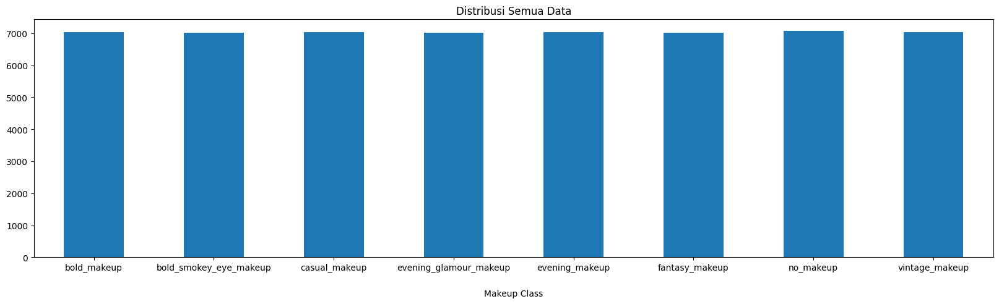

In [154]:
data_augmented_all_df.count()
data_augmented_all_df.count().plot(kind='bar', figsize=(20, 5))

plt.title("Distribusi Semua Data")

plt.xlabel("Makeup Class", labelpad=20)
plt.xticks(rotation=0)

plt.show()

**SAMPLING IMAGE**

In [7]:
NUM_SAMPLES = 100
NUM_COLS = 4 
NUM_ROWS = (NUM_SAMPLES + NUM_COLS - 1) // NUM_COLS

label_augmented_path = [path for path in glob(f"{AUGMENT_LABEL_PATH}/*.txt")]
random_index = random.sample(range(0, len(label_augmented_path)), NUM_SAMPLES)

label_augmented_sample = [label_augmented_path[path] for path in random_index]

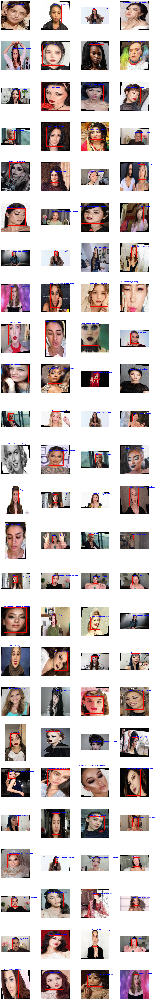

In [33]:
plt.figure(figsize=(16, 100))

for i, path in enumerate(label_augmented_sample):
    # Read image
    image_name = path.split("\\")[-1]
    image_name = ".".join(image_name.split(".")[:-1])
    image_path = f"{AUGMENT_IMAGE_PATH}/{image_name + '.jpg'}"

    image = cv2.imread(image_path)

    # Plot image
    plt.subplot(NUM_ROWS, NUM_COLS, i + 1)

    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    
    # Plot box
    label, x, y, w, h = map(float, open(path, 'r').read().split())
    label = MAKEUP_LABELS_MAP_8[label]
    
    image_height, image_width, _ = image.shape
    x_center_abs = int(x * image_width)
    y_center_abs = int(y * image_height)
    width_abs = int(w * image_width)
    height_abs = int(h * image_height)
    
    rect = patches.Rectangle(
            (x_center_abs - width_abs // 2, y_center_abs - height_abs // 2),
            width_abs, height_abs, linewidth=2, edgecolor='r', facecolor='none'
        )
    
    plt.gca().add_patch(rect)
    plt.text(x_center_abs - width_abs // 2, y_center_abs - height_abs // 2 - 5, f'Class: {label}', color='b', weight='bold')

plt.tight_layout()
plt.show()